<a href="https://colab.research.google.com/github/AyawnKhan/ML-Labs/blob/main/FINAL%20DRAFT%20Lab2_Linked.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**5000 Level
Group: Victoria Valdez, Ayan Khan, Anika Saiprabhu**

# 1. Business Understanding

Weather prediction provides important information that organizations/individuals can use to help mitigate weather related losses. Because of the sheer amount of locations that exist across the planet, it is infeasible for people to individually classify the kind of weather occuring in different areas.



The dataset we chose is Weather Image Recognition data from the following Kaggle dataset: https://www.kaggle.com/datasets/jehanbhathena/weather-dataset?resource=download.


> This data includes 6862 images of different types of weather spread across 11 different categories: dew, fog/smog, frost, glaze, hail, lightning, rain, rainbow, rime, sandstorm, and snow.




 We hope our analysis can help weather organizations move towards automating the categorization of weather types. This would enable companies to identify abnormal/concerning weather patterns in geographic areas and take action accordingly to address concerns in the affected areas. Beyond crisis response, automating weather reporting allows individuals to maximize their comfort by being prepared for the respective weather conditions in their area.

 To this end, our main goal with today's analysis is to identify more effective feature extraction methods that weather organizations can use in their mission. We chose to primarily compare Principal Component Analysis (PCA) and DAISY Image Extraction.

# 2. Data Preparation

## 2.1 Setting up the data

### 2.1.1 - Imports

For this assignment, we used Google Colab to code parts of the project together as a team. To begin, we cloned  a Github repository where the data was saved. We also imported and installed most of the necessary libraries at the top of the notebook.

In [203]:
# !git clone https://github.com/AyawnKhan/ML-Labs.git

In [204]:
# !pip install numpy
# !pip install Pillow

In [205]:
import numpy as np
from numpy import asarray

import pandas as pd
import os

from PIL import Image
from sklearn.decomposition import PCA
from skimage.feature import daisy

import matplotlib.pyplot as plt
import time
import seaborn as sns


### 2.1.2 - Navigating Files and Reading Data




This next cell was used to navigate to the dataset within Colab's files. The code loops through the directory and prints  all the files present in the directory to confirm the contents.

In [206]:
# Colab defaults to the "content" directory
# This code changes the working directory to the data directory
if (os.getcwd() == '/content'):
  os.chdir('./ML-Labs/Lab2/dataset')
print("New working directory: ",os.getcwd()) # Check that new working dirctory is right

allfilenames = []
dirList = os.listdir("./")
print(dirList)
print()
for root, dirs, files in os.walk('.'):
  for x in range(len(files)):
    files[x] = root[2:] + '_' + files[x]
    allfilenames.append(files[x])
  print("Root: ", root[2:]) # Prints without the "./" at the start of root
  print("Files: ", files)
  print()
  # for image in files:
  #   if image.endswith((".jpg")):
  #     pass


New working directory:  /content/ML-Labs/Lab2/dataset
['lightning', 'sandstorm', 'rime', 'rain', 'fogsmog', 'dew', 'frost', 'rainbow', '.DS_Store', 'hail', 'glaze', 'snow']

Root:  
Files:  ['_.DS_Store']

Root:  lightning
Files:  ['lightning_2101.jpg', 'lightning_1994.jpg', 'lightning_1839.jpg', 'lightning_2159.jpg', 'lightning_2032.jpg', 'lightning_2045.jpg', 'lightning_2060.jpg', 'lightning_2053.jpg', 'lightning_1868.jpg', 'lightning_2003.jpg', 'lightning_2119.jpg', 'lightning_2085.jpg', 'lightning_1947.jpg', 'lightning_1962.jpg', 'lightning_1861.jpg', 'lightning_1950.jpg', 'lightning_2092.jpg', 'lightning_1876.jpg', 'lightning_1953.jpg', 'lightning_2029.jpg', 'lightning_1873.jpg', 'lightning_2131.jpg', 'lightning_2154.jpg', 'lightning_1833.jpg', 'lightning_1901.jpg', 'lightning_1956.jpg', 'lightning_2186.jpg', 'lightning_1992.jpg', 'lightning_2028.jpg', 'lightning_2195.jpg', 'lightning_2200.jpg', 'lightning_2074.jpg', 'lightning_2187.jpg', 'lightning_2113.jpg', 'lightning_2199.jpg'

The following code loops through the directory and creates a dataframe matching the filepaths with the category labels for each file (the type of weather that the file is). This code also removes the .DS_Store folder, because it is unecessary for our analysis.

In [207]:
# Generate data paths with labels
data_dir = os.getcwd()
filepaths = []
labels = []

folds = os.listdir(data_dir)
folds.remove('.DS_Store')
for fold in folds:
    foldpath = os.path.join(data_dir, fold)
    filelist = os.listdir(foldpath)
    for file in filelist:
        fpath = os.path.join(foldpath, file)
        filepaths.append(fpath)
        labels.append(fold)

# Concatenate data paths with labels into one dataframe
Fseries = pd.Series(filepaths, name= 'filepaths')
Lseries = pd.Series(labels, name='labels')
df = pd.concat([Fseries, Lseries], axis= 1)

In [208]:
# displays the dataframe
df

,filepaths,labels
0,/content/ML-Labs/Lab2/dataset/lightning/2101.jpg,lightning
1,/content/ML-Labs/Lab2/dataset/lightning/1994.jpg,lightning
2,/content/ML-Labs/Lab2/dataset/lightning/1839.jpg,lightning
3,/content/ML-Labs/Lab2/dataset/lightning/2159.jpg,lightning
4,/content/ML-Labs/Lab2/dataset/lightning/2032.jpg,lightning
...,...,...
6857,/content/ML-Labs/Lab2/dataset/snow/1253.jpg,snow
6858,/content/ML-Labs/Lab2/dataset/snow/1034.jpg,snow
6859,/content/ML-Labs/Lab2/dataset/snow/1212.jpg,snow
6860,/content/ML-Labs/Lab2/dataset/snow/1126.jpg,snow


This code prints out the format, size, and mode of the first image in the dataframe. We tested the datatype and shape for images in a numpy array – as well as the type, mode, and size for PIL images. These outputs were used as a reference by for some of the other parts of the code to confirm that our syntax was accurate throughout the assignment.

In [209]:


img = Image.open(df.filepaths[0])

print(img.format)
print(img.size)
print(img.mode)
print()


numpydata = asarray(img)

# <class 'numpy.ndarray'>
print(type(numpydata))

#  shape
print(numpydata.shape)
print()

pilImage = Image.fromarray(numpydata)
print(type(pilImage))

# Let us check  image details
print(pilImage.mode)
print(pilImage.size)
print(pilImage)

JPEG
(400, 270)
RGB

<class 'numpy.ndarray'>
(270, 400, 3)

<class 'PIL.Image.Image'>
RGB
(400, 270)
<PIL.Image.Image image mode=RGB size=400x270 at 0x7EF6EF70C490>


### 2.1.3 - Resizing and Recoloring Images

The following code loops through the data and processes any image files: it converts the images to grayscale and resizes them to 100 x 100. At this point the images are saved as np arrays within a list named "images". This image data will be linearized a little further down in our analysis.

In [210]:
# Empty list to store the image data in
images = []

# Open each image, recolor to greyscale, resize to 100x100 pixels, and add to the list
for i in df.filepaths:
    if i.endswith((".jpg", ".jpeg", ".png", ".gif")):
        img = Image.open(i)
        img = Image.open(i).convert("L")  #convert image to grayscale
        img = img.resize((100, 100))  #resize images to 100x100 pixels
        images.append(np.array(img))

This code confirms that there all of the files have been processd into images; the number of files = the number of images. This confirms that they have all been read properly.

In [211]:
# The filename list stores an extranneous name at the beginning, so we remove it to clean it up
allfilenames.pop(0)

print(len(allfilenames))
print(len(images))

6862
6862


We then stored the data additionally in a pandas dataframe for easy manipulation.

In [212]:
# Store the image data and label data in a data frame

data = pd.DataFrame(
    {'Image': images,
     'Label': allfilenames
    })

### 2.1.4 - Visualizing Images

The *plot_gallery* function plots images in a *n_row* by *n_col* grid. The gallery below showcases sandstorm data, because these are the first images stored from the data. The gallery plotted below shows images from the dataset(after resizing and being grayscaled). This function will be used often throughout this report.

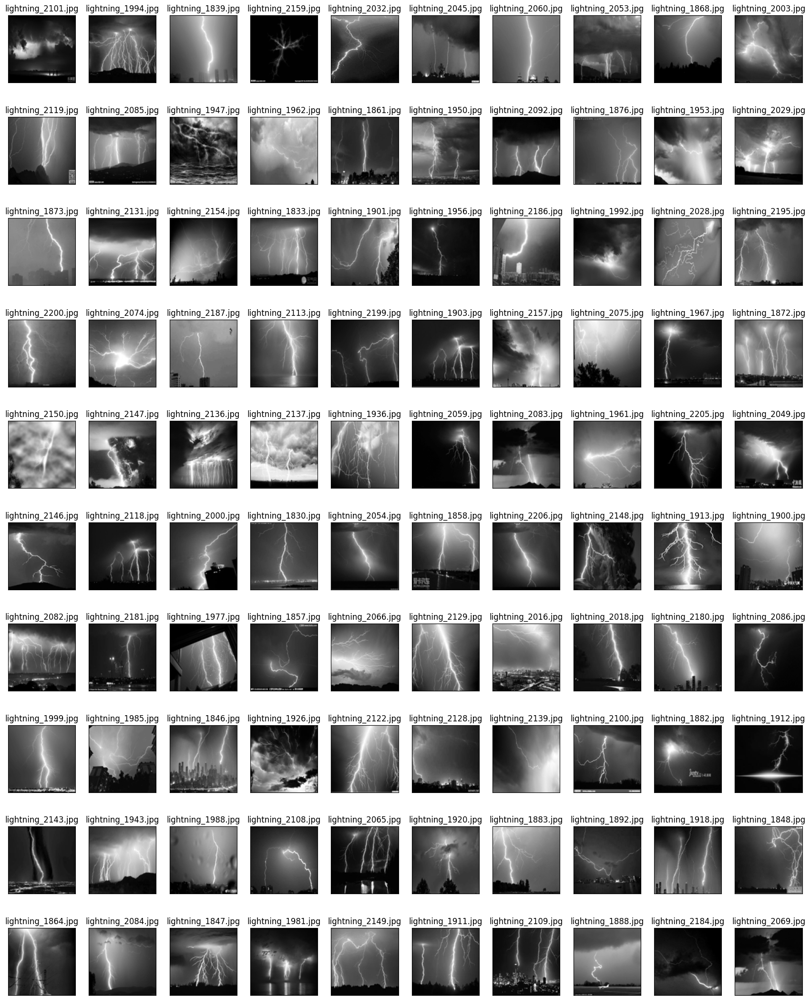

In [213]:
# Plot several images

def plot_gallery(images, titles, n_row=10, n_col=10):
    """Helper function to plot a gallery of portraits"""
    plt.figure(figsize=(1.7 * n_col, 2.3 * n_row))
    plt.subplots_adjust(bottom=0, left=.01, right=.99, top=.90, hspace=.35)
    for i in range(n_row * n_col):
        plt.subplot(n_row, n_col, i + 1)
        plt.imshow(images[i], cmap=plt.cm.gray)
        plt.title(titles[i], size=12)
        plt.xticks(())
        plt.yticks(())

# Call the function to plot a few of the first items present in the image data
plot_gallery(data['Image'], data['Label'])

The following loop reduces the image data to two types:'dew' and 'lightning' weather types. We aim to conduct a binary classification for this data, and we selected these two types because the images are very visually different from each other. We believed these types would give us effective results.

In [214]:
images_red = []
files_red = []
types_red = []

# Image reduction to filter data to two weather types
for x in range(len(data['Label'])): # isolates lightning data
  if((data['Label'])[x][0:3] == 'lig'):
    images_red.append((data['Image'])[x])
    files_red.append((data['Label'])[x])
    types_red.append("Lightning")
  elif((data['Label'])[x][0:3] == 'dew'): # isolates dew data
    images_red.append((data['Image'])[x])
    files_red.append((data['Label'])[x])
    types_red.append("Dew")

# confirms reduction is equal
print(len(images_red))
print(len(files_red))
print(len(types_red))

1075
1075
1075


The following code block visualizes the data that we had reduced above. We decided to reduce the data further to 30 images of each data type.

It made sense to visualize 60 images total compared to 1075 for the sake of both runtime and efficiency. The number 30 was somewhat arbitrarily chosen, but we believe it indicates a wide array of data without being excessive.

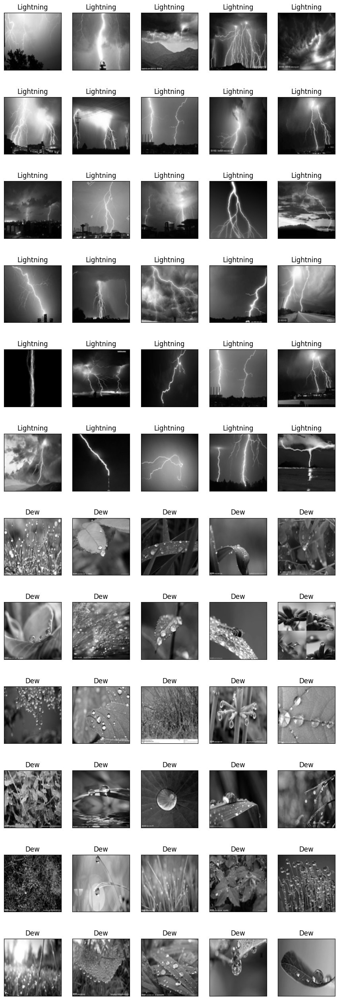

In [215]:
# Visualize some of each weather type

# Create a subsect of images and associated label data
images_plot = []
files_plot = []
types_plot = []
num_weather = 30

# The two lists contain all weather types grouped together
#     This loop identifies where one weather type changes into another
#     And grabs five of each weather type
for x in range(len(images_red) - 1):
  if(x == (len(images_red) - 2)):
    for i in range(num_weather):
      images_plot.append((images_red)[x - i])
      #files_plot.append((files_red)[x - i])
      types_plot.append((types_red)[x - i])
  if (files_red[x])[0:3] != ((files_red)[x + 1])[0:3]:
    for i in range(num_weather):
      images_plot.append((images_red)[x - i])
      #files_plot.append((files_red)[x - i])
      types_plot.append((types_red)[x - i])


plot_gallery(images_plot, types_plot, 12, 5)

# 3. Data Reduction

## 3.1 PCA

The code cell below flattens the resized images from above. This prepares the data for PCA in the following cell.

In [216]:
#flatten the resized images
flattened_images = [img.flatten() for img in images_plot]
print(len(flattened_images))

#perform PCA

60


We then conducted the actual PCA analysis. Using the class code as a template, we fit PCA onto the list of flattened images.

The use of n_components was qualitatively chosen; we tested a wide array of n_components and reran the analysis until coming upon an appropriate-looking graph. Under section 3.3.1 we show further exploration of different n_components values.

The time is printed here, but the actual time difference analysis is conducted under section 3.3.2.



In [217]:

n_components = 8

pca = PCA(n_components=n_components, svd_solver='full')
start_time = time.time()
%time pca.fit(flattened_images.copy())  # Fit PCA on the flattened images
pca_time = time.time() - start_time
eigenfaces = pca.components_.reshape((n_components, 100, 100))

print(len(eigenfaces))

CPU times: user 152 ms, sys: 144 ms, total: 295 ms
Wall time: 313 ms
8


This plot is fairly self explanatory; we plotted the explained variance ratio by number of principal components. The purpose of this plot is to help visualize how much of the total variance in the dataset is captured by the first N principal components.

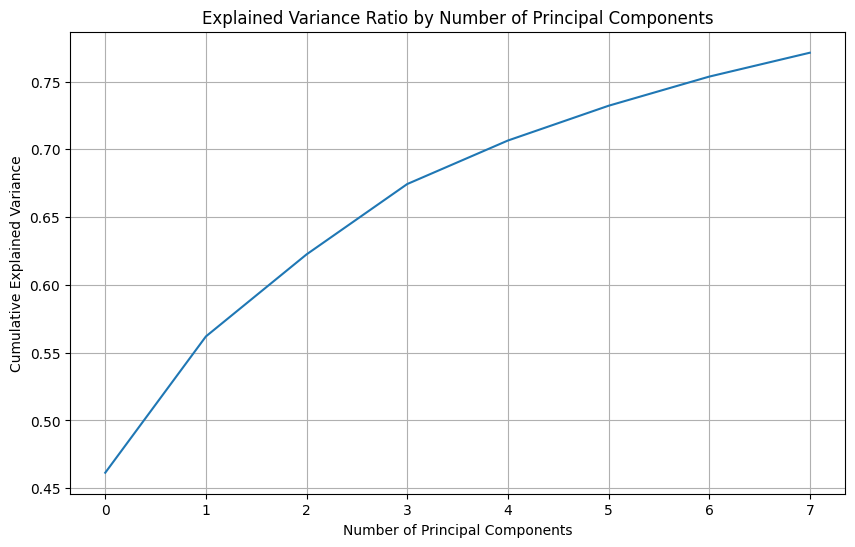

In [218]:
#plot explained variance
def plot_explained_variance(pca):
    plt.figure(figsize=(10, 6))
    plt.plot(np.cumsum(pca.explained_variance_ratio_))
    plt.xlabel('Number of Principal Components')
    plt.ylabel('Cumulative Explained Variance')
    plt.title('Explained Variance Ratio by Number of Principal Components')
    plt.grid(True)
    plt.show()

plot_explained_variance(pca)

60
60
8
range(0, 8)


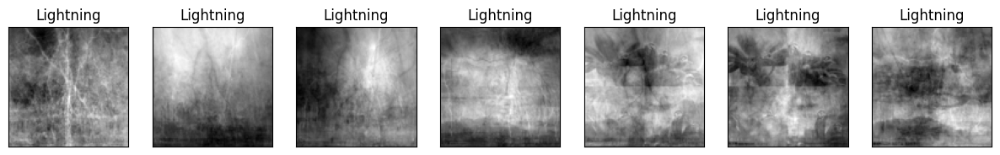

In [219]:
print(len(types_plot))
print(len(flattened_images))
print(eigenfaces.shape[0])
print(range(eigenfaces.shape[0]))

eigenface_titles = ["%s" % types_plot[i] for i in (range(eigenfaces.shape[0] - 1))]
plot_gallery(eigenfaces, eigenface_titles, n_row=1, n_col=n_components-1)


## 3.2 Randomized PCA

The following calculation is almost the same as the normal PCA, but it uses randomized PCA. Instead of computing eigenvectors of the covariance matrix, random PCA uses random projections.

In [220]:
#perform randomized PCA
n_components = 8
print("Extracting the top %d eigenfaces from %d faces" % (n_components, len(flattened_images)))

rpca = PCA(n_components=n_components)
start_time = time.time()
%time rpca.fit(flattened_images.copy())  #fit PCA on the flattened images
rpca_time = time.time() - start_time
r_eigenfaces = rpca.components_.reshape((n_components, 100, 100))



Extracting the top 8 eigenfaces from 60 faces
CPU times: user 88.9 ms, sys: 92 ms, total: 181 ms
Wall time: 144 ms


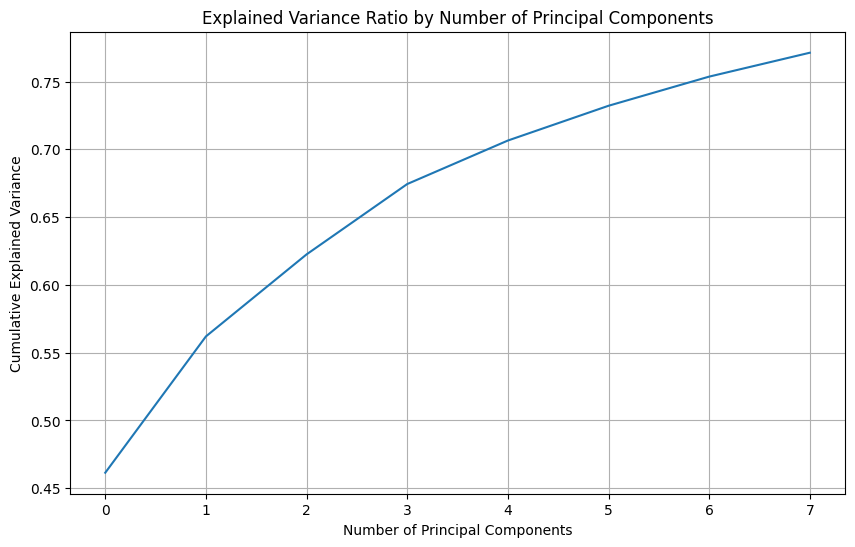

In [221]:
plot_explained_variance(rpca)

## 3.3 Comparing Random and Non-random PCA

In this section, we hope to understand which dimensionality methods are better at representing the images. We first did this by comparing the plotted variance ratios above.

### 3.3.1 Plotting Comparisons

The following graph plots both explained variance ratio curves from above together.

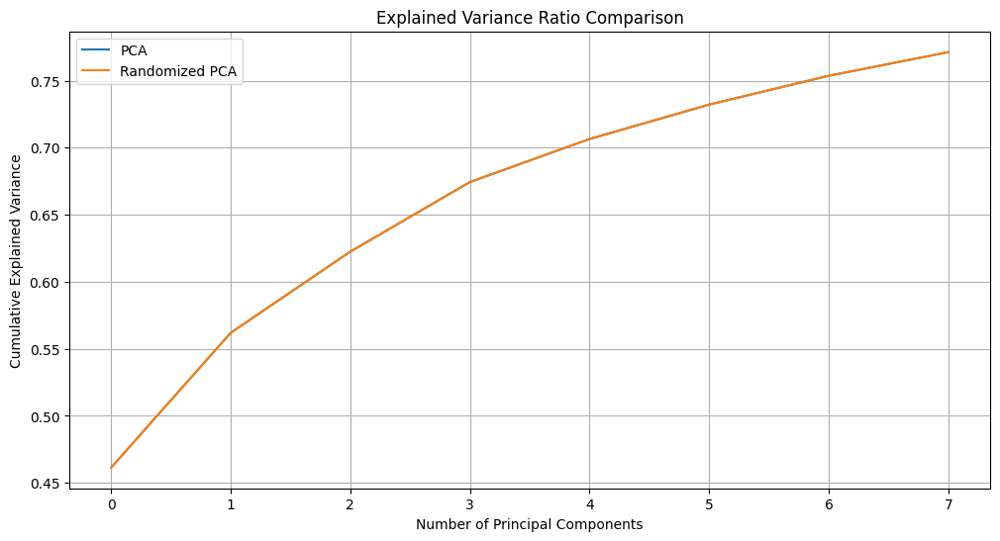

In [222]:
#Explained Variance Comparison
plt.figure(figsize=(12, 6))
plt.plot(np.cumsum(pca.explained_variance_ratio_), label='PCA')
plt.plot(np.cumsum(rpca.explained_variance_ratio_), label='Randomized PCA')
plt.xlabel('Number of Principal Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('Explained Variance Ratio Comparison')
plt.legend()
plt.grid(True)
plt.show()

The PCA and randomized PCA appear to return identical results on the graph. Since we can't see the PCA, that means that the randomized PCA was plotted directly on top of it; i.e. the two lines were exactly the same.

We attributed this result to the data set. Our data had only 11 features; this was reduced to 2 features that we processed for much of the image processing. Because of the lower dimensionality of our data, the approximation made by randomized PCA is likely very similar to that of PCA. Despite our initial confusion, we confirmed with the TA that results seemed appropriate given our data.

We then decided to further explore the differences between the two methods.

### 3.3.2 - N Components

The first thing we analyzed was the way that n_components would affect the explained variance comparison. We knew that this wouldn't greatly affect the difference between PCA and randomized PCA, but we wanted to visualize the way that different n_components would change the results of the above analysis.

The widget below uses the same code we already ran above, but re-plots the explained variance ratio using the different n_components.

In [223]:
from ipywidgets import widgets as wd

# combines the pca calculation and the plotting function from above
def full_pca(n_components):
  pca = PCA(n_components=n_components, svd_solver='full')
  pca.fit(flattened_images.copy())  # Fit PCA on the flattened images
  eigenfaces = pca.components_.reshape((n_components, 100, 100))
  return pca.explained_variance_ratio_

def r_pca(n_components):
  rpca = PCA(n_components=n_components)
  rpca.fit(flattened_images.copy())  #fit PCA on the flattened images
  r_eigenfaces = rpca.components_.reshape((n_components, 100, 100))
  return rpca.explained_variance_ratio_

def plot_comp(n_components):
  full_pca(n_components)
  r_pca(n_components)
  plt.figure(figsize=(12, 6))
  plt.plot(np.cumsum(full_pca(n_components)), label='PCA')
  plt.plot(np.cumsum(r_pca(n_components)), label='Randomized PCA')
  plt.xlabel('Number of Principal Components')
  plt.ylabel('Cumulative Explained Variance')
  plt.title('Explained Variance Ratio Comparison')
  plt.legend()
  plt.grid(True)
  plt.show()

wd.interact(plot_comp,n_components=(0,15,1),__manual=True)
wd.interact(plot_comp,n_components=(0,60,10),__manual=True)


interactive(children=(IntSlider(value=7, description='n_components', max=15), Output()), _dom_classes=('widget…

interactive(children=(IntSlider(value=30, description='n_components', max=60, step=10), Output()), _dom_classe…

<function __main__.plot_comp(n_components)>

We aimed to pick an n_components that would allow us to maximize the variance explained in order to retain as much information as possible, while also minimizing the number of components in order to simplify the model and reduce computational complexity.

After testing different values again, we were convinced that an n_components of 8 worked well for our data.

### 3.3.3 - Time Comparison

Using the time calculated above, we summarized the information on the time that each process took.

In [224]:

#Computation Time Comparison
print("Computation Time Comparison:")
print("PCA:", pca_time)
print("Randomized PCA:", rpca_time)
print("Difference: ", abs(rpca_time-pca_time))

Computation Time Comparison:
PCA: 0.31629133224487305
Randomized PCA: 0.1464085578918457
Difference:  0.16988277435302734


Comparing the time that it takes to run the two methods makes the difference between the two very apparent. Randomized PCA is much faster, taking over half as long as the standard PCA. This is likely due to the approximations random PCA makes as part of the calculation process.

Given the apparent identical results of the two methods, it becomes clear that random PCA may be better for the data we chose. Before concluding this, we wanted to confirm that the quality of the two methods was the same.

### 3.3.4 - Quality Comparison

We then plotted original images compared to the reconstructed images using the eigenfaces resulting from the PCA/randomized PCA calculations. We aimed to see whether there was a visual difference between the methods used and their original images.

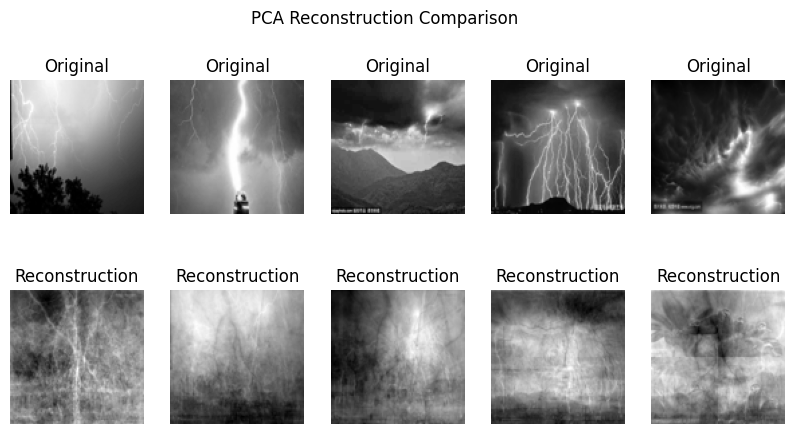

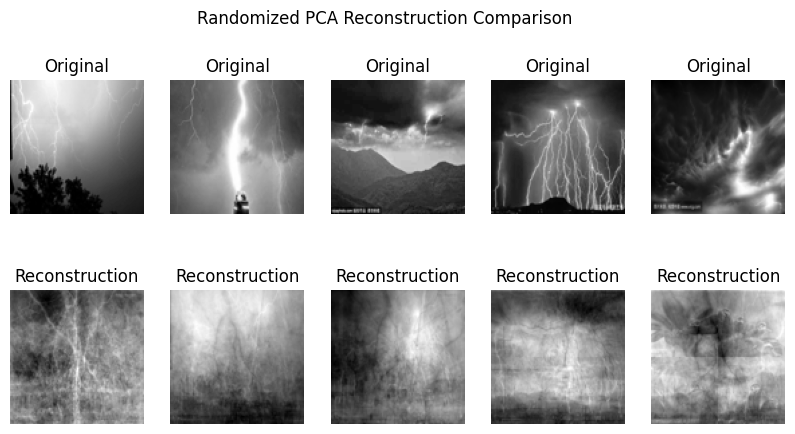

In [225]:
#Quality of Reconstruction Comparison
def plot_reconstructed_images(images, eigenfaces, title):
    plt.figure(figsize=(10, 5))
    for i in range(5):
        # plots the original images
        plt.subplot(2, 5, i + 1)
        plt.imshow(images[i].reshape(100, 100), cmap='gray')
        plt.title('Original')
        plt.axis('off')

        # plots the reconstructed images
        plt.subplot(2, 5, i + 6)
        plt.imshow(eigenfaces[i].reshape(100, 100), cmap='gray')
        plt.title('Reconstruction')
        plt.axis('off')
    plt.suptitle(title)


plot_reconstructed_images(flattened_images, eigenfaces, 'PCA Reconstruction Comparison')

plot_reconstructed_images(flattened_images, r_eigenfaces, 'Randomized PCA Reconstruction Comparison')

Upon seeing these results, there is a clear conclusion that randomized PCA is more effective for our data. Since both methods seem to be equally effective in both analyzing and reconstructing the images, the faster version is most efficient for our use.

## 3.4 DAISY Image Processing

The next section uses DAISY image processing to extract features from the images in our data. We started this by computing and visualizing DAISY descriptors for an example image.

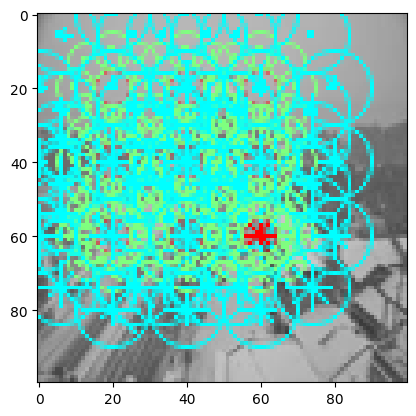

In [226]:
# View the daisy parameters

features, img_desc = daisy(img,
                           step=20,
                           radius=20,
                           rings=2,
                           histograms=8,
                           orientations=8,
                           visualize=True)
plt.imshow(img_desc)
plt.grid(False)
plt.show()

This code simply clarifies some of the information about the features. It was used to confirm that our code was processing this information correctly.

In [227]:
# Information about the Daisy features

features = daisy(img, step=10, radius=20, rings=2, histograms=8, orientations=4, visualize=False)
print("The shape of the features: ", features.shape)
print("The size of the features: ", features.shape[0]*features.shape[1]*features.shape[2])

The shape of the features:  (6, 6, 68)
The size of the features:  2448


We then defined a functions  to use DAISY to extract features from a singular image.

In [228]:
# Daisy on a singular image: extracting features from an image

def apply_daisy(row,shape):
    feat = daisy(row.reshape(shape), step=10, radius=20,
                 rings=2, histograms=8, orientations=4,
                 visualize=False)
    return feat.reshape((-1))

# View the shape of the test Daisy
%time test_feature = apply_daisy(flattened_images[3],(100,100))
test_feature.shape

CPU times: user 24.6 ms, sys: 73 µs, total: 24.7 ms
Wall time: 42.4 ms


(2448,)

We applied the function defined above to extract features on the group of images in flattened_images.

In [229]:
# Daisy on a group of images: extracting features from a smaller group of images represnting each weather type
#     For the sake of runtime, we will use Daisy to visualize only a smaller set of image data

%time daisy_features = np.apply_along_axis(apply_daisy, 1, flattened_images, (100,100))
print(daisy_features.shape)

CPU times: user 840 ms, sys: 4.36 ms, total: 844 ms
Wall time: 888 ms
(60, 2448)


The following code calculates pairwise distance between image features using DAISY. It uses this distance to plot the closest image in the dataset.

CPU times: user 4.7 ms, sys: 1.96 ms, total: 6.66 ms
Wall time: 7.17 ms


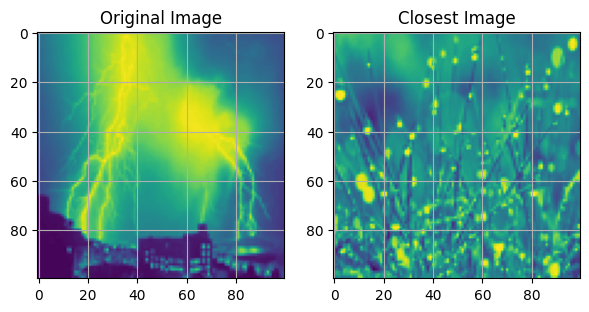

In [230]:
# Daisy visualization on a single image:

from sklearn.metrics.pairwise import pairwise_distances

# find the pairwise distance between all the different image features
%time dist_matrix = pairwise_distances(daisy_features)

import copy

# find closest image to current image
idx1 = 5
distances = copy.deepcopy(dist_matrix[idx1,:])
distances[idx1] = np.infty # dont pick the same image!
idx2 = np.argmin(distances)

# Plot the original image
plt.figure(figsize=(7,10))
plt.subplot(1,2,1)
plt.imshow(flattened_images[idx1].reshape((100,100)))
plt.title("Original Image")
plt.grid()

# Plot the closest image
plt.subplot(1,2,2)
plt.imshow(flattened_images[idx2].reshape((100,100)))
plt.title("Closest Image")
plt.grid()

We used a similar process to plot multiple images of the dew weather. For efficiency, this was only conducted on a smaller subset of the data

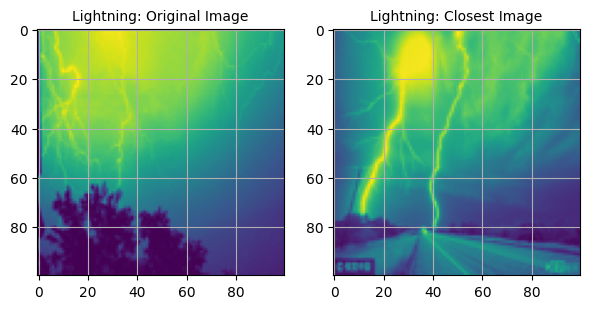

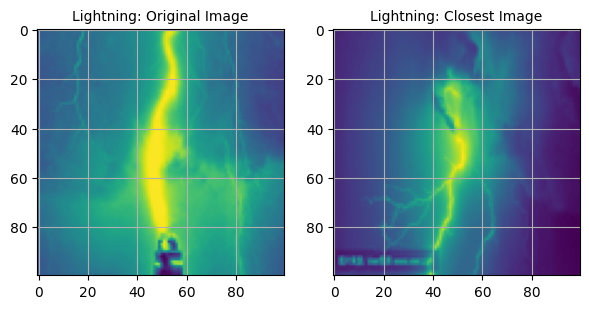

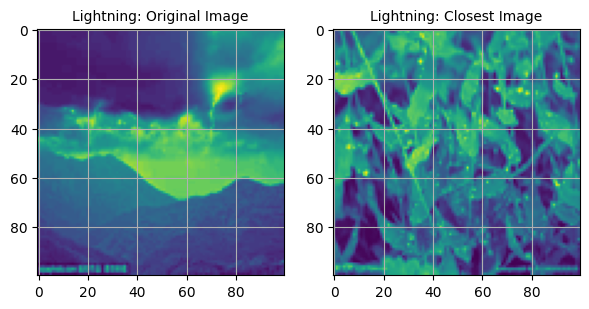

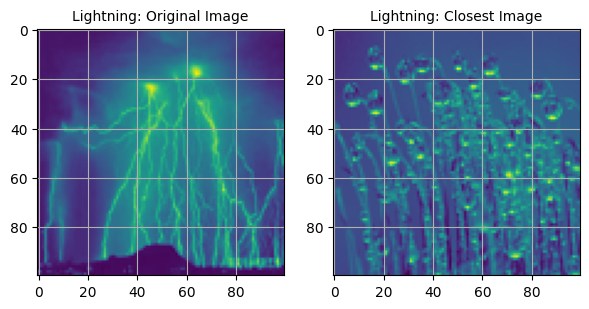

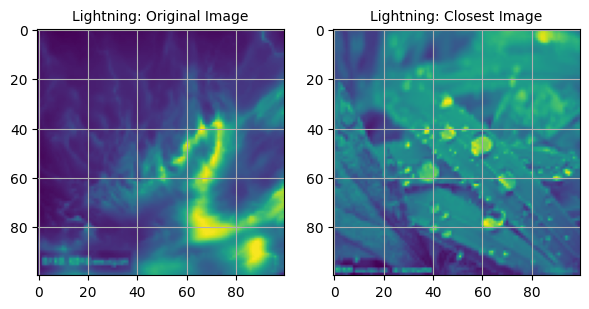

...

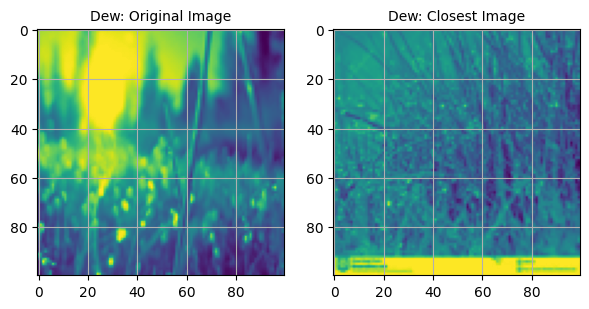

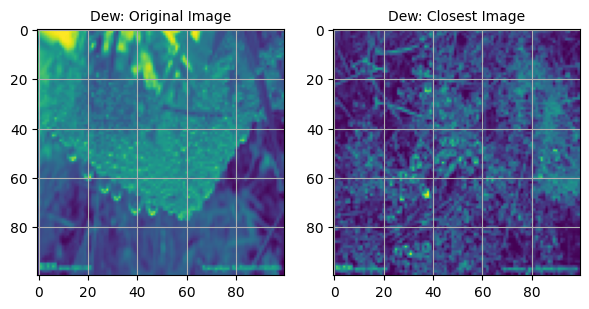

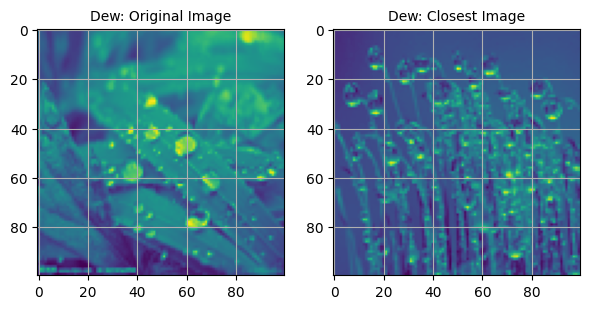

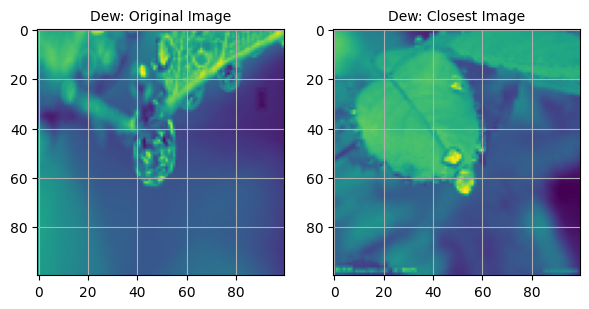

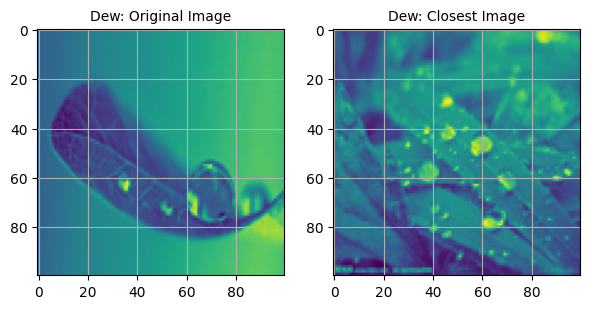

In [231]:
# Daisy visualization on multiple images of each weather type


# Iterate through each item in the group of images
for x in range(len(flattened_images)):
  idx1 = x
  distances = copy.deepcopy(dist_matrix[idx1,:])
  distances[idx1] = np.infty # dont pick the same image!
  idx2 = np.argmin(distances)

  # Plot the original image
  plt.figure(figsize=(7,10))
  plt.subplot(1,2,1)
  plt.imshow(flattened_images[idx1].reshape((100,100)))
  plt.title(types_plot[x] + ": Original Image", fontsize = 10)
  plt.grid()

  # Plot the closest image
  plt.subplot(1,2,2)
  plt.imshow(flattened_images[idx2].reshape((100,100)))
  plt.title(types_plot[x] + ": Closest Image", fontsize = 10)
  plt.grid()

  plt.show()

Visually, you can see that the closest images for the most part match the original images. The images have visual characteristics that are recognizable in the closest image, even at a casual glance. This is true even when the closest image classification doesn't match that of the original image.

Our next goal was to determine how accurate this classification actually is. Though visually it appears to be accurate, we needed to calculate this using the full dataset.

## 3.5 KNN

The last major section of our analysis involves K Nearest Neighbor classification. We wanted to compare the results of PCA with that of the DAISY image processing. We used KNN to actually see the image classification performance.


We started this process by flattening images for both weather types. Previous visualization operations were conducted with a smaller subset of the data, but for the classification model we wanted to run the entire dataset for more accurate results.

In [232]:
# Flatten the collection of all images for both weather types
flat_all_images = [img.flatten() for img in images_red]

# Create X and y variables
X = flat_all_images # X: image data
y = types_red # y: classification labels

# Print  sizes check dimensions
print(len(X))
print(len(y))

1075
1075


We printed the sizes of X and Y here to ensure that each dimension is of equal size. They are both correct.

The following code imports the necessary modules and initializes the necessary classifiers that will be used for our analysis..

In [233]:
# Import necessary sklearn modules
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split

# init a classifier for each feature space
knn_pca = KNeighborsClassifier(n_neighbors=1)
knn_dsy = KNeighborsClassifier(n_neighbors=1)


This runs PCA on the image data similarly to the code in our above sections.

In [234]:
# Run a PCA on the image data

pca = PCA(n_components=2)
pca.fit(X) # fit data and then transform it
X_pca = pca.transform(X)

# Extract the features of the images
X_pca_features = rpca.transform(copy.deepcopy(X))
dist_matrix_pca = pairwise_distances(copy.deepcopy(X_pca_features),
                                     metric="seuclidean")

pca_obj = PCA(n_components=60)
X_pca_features = pca_obj.fit_transform(X)

This code runs DAISY on the image data similarly to the code in our above sections.

In [235]:
# Perform Daisy on the image data
#     For the sake of runtime, we completed previous visualization operations with a smaller
#     set of data, but for a classification model, we want to run the entire dataset

%time daisy_features_all = np.apply_along_axis(apply_daisy, 1, flat_all_images, (100,100))
print(daisy_features_all.shape)

CPU times: user 18.4 s, sys: 71.6 ms, total: 18.4 s
Wall time: 23.2 s
(1075, 2448)


This last section calculates the accuracies of both image processing methods. We started by separating the data, fitting it into each classifier, and finally scoring the data using the KNN model we initialized above.

In [236]:
# Train the model and run tests

# separate the data into train/test
pca_train, pca_test, dsy_train, dsy_test, y_train, y_test = train_test_split(
    X_pca_features,daisy_features_all, y, test_size=0.2, train_size=0.8)

# fit each classifier
knn_pca.fit(pca_train,y_train)
acc_pca = accuracy_score(knn_pca.predict(pca_test),y_test)

knn_dsy.fit(dsy_train,y_train)
acc_dsy = accuracy_score(knn_dsy.predict(dsy_test),y_test)

# report accuracy
print(f"PCA accuracy:{100*acc_pca:.2f}%, Daisy Accuracy:{100*acc_dsy:.2f}%".format())

PCA accuracy:73.49%, Daisy Accuracy:86.51%


This final output, though a single line, concludes all of the analysis that we had conducted above. Though both feature extraction methods have fairly high accuracies, DAISY is a clear winner. DAISY is a whole 13.02% more accurate than the PCA analysis. Therefore, we conclude that **DAISY feature extraction is more effective** than PCA for our data.  
- Note: we don't define a bound or predetermined range for what an acceptable accuracy score might be for our model. We chose not to do this because our primary goal was to determine which feature extraction method is more effective; even if both had very low accuracies we would still learn a lot by analyzing why that was the case.

We believe that DAISY is a more effective feature extraction method for our data for a few specific reasons:
1. DAISY is designed specifically for image data. It is likely optimized better for our specific goal.
2. DAISY is better at dense feature extraction than PCA is. With the images that we were using, especially after being resized and reduced, this difference would result in a noteable increase in accuracy for DAISY.
3. PCA might lose important information during the dimensionality reduction process; for data like ours where the images all look somewhat different, DAISY's ability to extract mroe specific features stands out.

